<a href="https://colab.research.google.com/github/MaeMorano/Git-Colab-Practice/blob/master/Charts_Practice.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
from google.colab import files
files.upload()

Saving nyc-rolling-sales.csv to nyc-rolling-sales.csv


{'nyc-rolling-sales.csv': b',BOROUGH,NEIGHBORHOOD,BUILDING CLASS CATEGORY,TAX CLASS AT PRESENT,BLOCK,LOT,EASE-MENT,BUILDING CLASS AT PRESENT,ADDRESS,APARTMENT NUMBER,ZIP CODE,RESIDENTIAL UNITS,COMMERCIAL UNITS,TOTAL UNITS,LAND SQUARE FEET,GROSS SQUARE FEET,YEAR BUILT,TAX CLASS AT TIME OF SALE,BUILDING CLASS AT TIME OF SALE,SALE PRICE,SALE DATE\n4,1,ALPHABET CITY,07 RENTALS - WALKUP APARTMENTS             ,2A,392,6, ,C2,153 AVENUE B, ,10009,5,0,5,1633,6440,1900,2,C2,6625000,2017-07-19 00:00:00\n5,1,ALPHABET CITY,07 RENTALS - WALKUP APARTMENTS             ,2,399,26, ,C7,234 EAST 4TH   STREET, ,10009,28,3,31,4616,18690,1900,2,C7, -  ,2016-12-14 00:00:00\n6,1,ALPHABET CITY,07 RENTALS - WALKUP APARTMENTS             ,2,399,39, ,C7,197 EAST 3RD   STREET, ,10009,16,1,17,2212,7803,1900,2,C7, -  ,2016-12-09 00:00:00\n7,1,ALPHABET CITY,07 RENTALS - WALKUP APARTMENTS             ,2B,402,21, ,C4,154 EAST 7TH STREET, ,10009,10,0,10,2272,6794,1913,2,C4,3936272,2016-09-23 00:00:00\n8,1,ALPHABET CITY,

In [ ]:
import pandas as pd

df = pd.read_csv('nyc-rolling-sales.csv')
df.head(2)

,Unnamed: 0,BOROUGH,NEIGHBORHOOD,BUILDING CLASS CATEGORY,TAX CLASS AT PRESENT,BLOCK,LOT,EASE-MENT,BUILDING CLASS AT PRESENT,ADDRESS,APARTMENT NUMBER,ZIP CODE,RESIDENTIAL UNITS,COMMERCIAL UNITS,TOTAL UNITS,LAND SQUARE FEET,GROSS SQUARE FEET,YEAR BUILT,TAX CLASS AT TIME OF SALE,BUILDING CLASS AT TIME OF SALE,SALE PRICE,SALE DATE
0,4,1,ALPHABET CITY,07 RENTALS - WALKUP APARTMENTS,2A,392,6,,C2,153 AVENUE B,,10009,5,0,5,1633,6440,1900,2,C2,6625000,2017-07-19 00:00:00
1,5,1,ALPHABET CITY,07 RENTALS - WALKUP APARTMENTS,2,399,26,,C7,234 EAST 4TH STREET,,10009,28,3,31,4616,18690,1900,2,C7,-,2016-12-14 00:00:00


In [ ]:
df.dtypes

Unnamed: 0                         int64
BOROUGH                            int64
NEIGHBORHOOD                      object
BUILDING CLASS CATEGORY           object
TAX CLASS AT PRESENT              object
BLOCK                              int64
LOT                                int64
EASE-MENT                         object
BUILDING CLASS AT PRESENT         object
ADDRESS                           object
APARTMENT NUMBER                  object
ZIP CODE                           int64
RESIDENTIAL UNITS                  int64
COMMERCIAL UNITS                   int64
TOTAL UNITS                        int64
LAND SQUARE FEET                  object
GROSS SQUARE FEET                 object
YEAR BUILT                         int64
TAX CLASS AT TIME OF SALE          int64
BUILDING CLASS AT TIME OF SALE    object
SALE PRICE                        object
SALE DATE                         object
dtype: object

####Average Sale Price per Neighborhood: Top 20 Cheapest Neighborhood in New York

In [ ]:
df['SALE PRICE'].unique()
#Be careful with string values because there maybe spaces somewhere in the cell. You may get the uniques values or maybe do a str.strip

array(['6625000', ' -  ', '3936272', ..., '408092', '11693337', '69300'],
      dtype=object)

In [ ]:
#Cleaning only the Data I need for this chart
def change(x):
  y = x.strip() #applying strip() on each cell
  if y == '-' :
    return('0')
  else:
    return(y)

df['Sale Price'] = df['SALE PRICE'].apply(lambda x:change(x))
df['Sale Price'] = df['Sale Price'].astype(float)
df.head()

,Unnamed: 0,BOROUGH,NEIGHBORHOOD,BUILDING CLASS CATEGORY,TAX CLASS AT PRESENT,BLOCK,LOT,EASE-MENT,BUILDING CLASS AT PRESENT,ADDRESS,APARTMENT NUMBER,ZIP CODE,RESIDENTIAL UNITS,COMMERCIAL UNITS,TOTAL UNITS,LAND SQUARE FEET,GROSS SQUARE FEET,YEAR BUILT,TAX CLASS AT TIME OF SALE,BUILDING CLASS AT TIME OF SALE,SALE PRICE,SALE DATE,Sale Price
0,4,1,ALPHABET CITY,07 RENTALS - WALKUP APARTMENTS,2A,392,6,,C2,153 AVENUE B,,10009,5,0,5,1633,6440,1900,2,C2,6625000,2017-07-19 00:00:00,6625000.0
1,5,1,ALPHABET CITY,07 RENTALS - WALKUP APARTMENTS,2,399,26,,C7,234 EAST 4TH STREET,,10009,28,3,31,4616,18690,1900,2,C7,-,2016-12-14 00:00:00,0.0
2,6,1,ALPHABET CITY,07 RENTALS - WALKUP APARTMENTS,2,399,39,,C7,197 EAST 3RD STREET,,10009,16,1,17,2212,7803,1900,2,C7,-,2016-12-09 00:00:00,0.0
3,7,1,ALPHABET CITY,07 RENTALS - WALKUP APARTMENTS,2B,402,21,,C4,154 EAST 7TH STREET,,10009,10,0,10,2272,6794,1913,2,C4,3936272,2016-09-23 00:00:00,3936272.0
4,8,1,ALPHABET CITY,07 RENTALS - WALKUP APARTMENTS,2A,404,55,,C2,301 EAST 10TH STREET,,10009,6,0,6,2369,4615,1900,2,C2,8000000,2016-11-17 00:00:00,8000000.0


In [ ]:
#Grouping and sorting the values
average_price_by_neighborhood = df.groupby('NEIGHBORHOOD').mean()['Sale Price'].sort_values(ascending = True)
average_price_by_neighborhood.head()

NEIGHBORHOOD
PELHAM BAY                10.000000
CO-OP CITY            116000.000000
VAN CORTLANDT PARK    162450.000000
PORT IVORY            178874.424658
FRESH KILLS           199501.500000
Name: Sale Price, dtype: float64

In [ ]:
#Creating the y-axis list
neighborhood_list = list(average_price_by_neighborhood.index.values)
print(neighborhood_list)


['PELHAM BAY', 'CO-OP CITY', 'VAN CORTLANDT PARK', 'PORT IVORY', 'FRESH KILLS', 'PARKCHESTER', 'JAMAICA BAY', 'CONCORD-FOX HILLS', 'BROAD CHANNEL', 'ROCKAWAY PARK', 'PELHAM PARKWAY SOUTH', 'ARROCHAR-SHORE ACRES', 'TOMPKINSVILLE', 'NEW DORP-BEACH', 'MARINERS HARBOR', 'PORT RICHMOND', 'CAMBRIA HEIGHTS', 'NEW BRIGHTON', 'ARVERNE', 'HOWARD BEACH', 'GERRITSEN BEACH', 'LAURELTON', 'MIDLAND BEACH', 'ST. ALBANS', 'NEW SPRINGVILLE', 'BRIARWOOD', 'FLATLANDS', 'SOUTH JAMAICA', 'CONCORD', 'CANARSIE', 'QUEENS VILLAGE', 'FLORAL PARK', 'THROGS NECK', 'FLUSHING MEADOW PARK', 'WEST NEW BRIGHTON', 'FAR ROCKAWAY', 'KEW GARDENS', 'ROSEBANK', 'BERGEN BEACH', 'GREAT KILLS-BAY TERRACE', 'GLEN OAKS', 'GRANT CITY', 'BAYCHESTER', 'SOUTH OZONE PARK', 'ROSSVILLE-CHARLESTON', 'HILLCREST', 'ROSSVILLE-RICHMOND VALLEY', 'STAPLETON', 'GREAT KILLS', 'WILLOWBROOK', 'OAKLAND GARDENS', 'PELHAM PARKWAY NORTH', 'ARDEN HEIGHTS', 'ROSEDALE', 'NEW DORP', 'CYPRESS HILLS', 'BRIGHTON BEACH', 'WAKEFIELD', 'OAKWOOD', 'GRYMES HILL',

In [ ]:
import matplotlib.pyplot as plt

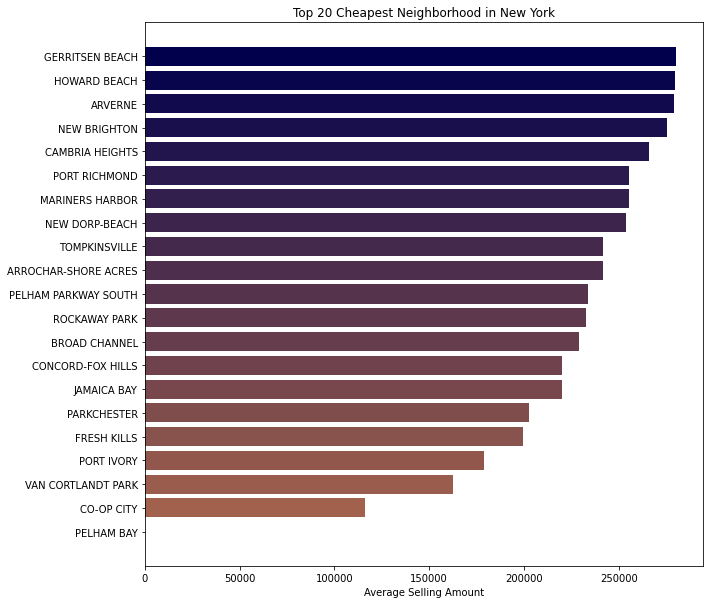

In [ ]:
#Creating x and y axis where we will get the top 20 neighborhoods
x = average_price_by_neighborhood[0:21]
y = neighborhood_list[0:21]

#Increasing the size of the charts figure
plt.figure(figsize=(10,10))

#Creating random color list
r = 0
g = 0
b = 0
my_colors = []
for i in range(0,21):
  r = (20 - i)/30
  g = (20 - i)/50
  b = 0.3
  color = [r,g,b]
  i = i - 1
  my_colors.append(color)

#Plotting the Chart  
plt.barh(y, x, align = 'center', color = my_colors)
plt.xlabel('Average Selling Amount')
plt.title('Top 20 Cheapest Neighborhood in New York')
plt.show()
